## Song Recommender System UI

< < E N T E R I N G   Y O U R   P E R S O N A L   R A D I O > > 



Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\xad\x00\x00\x00H\x08\x02\x00\x00\x00S([\xe4\x00\…

Good evening, Aria! It's 21:00 PM.
Song for the evening mood: [Rihanna - California King Bed]




~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ 



Name: Aria Stark
Account: Basic


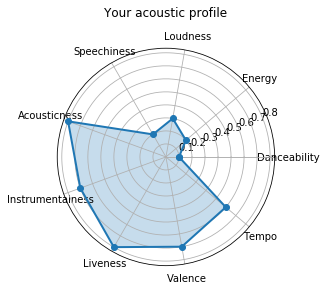



~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ 



>>>>>>>>>>>>>>>>>>>>>>> PEOPLE WITH SIMILAR TASTE ARE LISTENING TO <<<<<<<<<<<<<<<<<<<<<<


                    TITLE             ARTIST               GENRE
            Tempus Vernum               Enya   Rock_Contemporary
           Gli Amici Miei  Roberto Vecchioni  Folk_International
                Watermark               Enya  Folk_International
         Storms In Africa               Enya  Folk_International
              Double Pump          Girl Talk               Dance
 I'm Back (Album Version)        Lil Scrappy         Hip_Hop_Rap
              Pansy Twist         Huggy Bear                Punk
          The English Way          Fightstar    Rock_Alternative
                    Exile               Enya  Folk_International
          I Want Tomorrow               Enya   Rock_Contemporary


~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ ~ 

We recommend [T

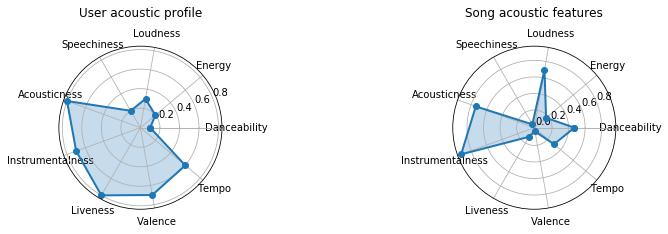

We recommend [Gli Amici Miei] by [Roberto Vecchioni] to you:


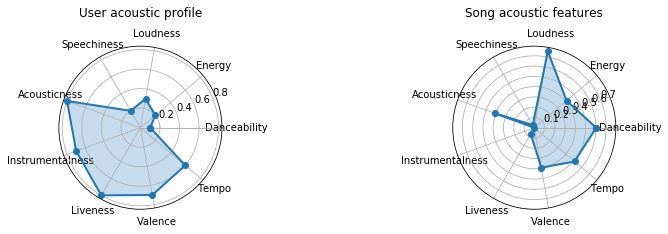

We recommend [Watermark] by [Enya] to you:


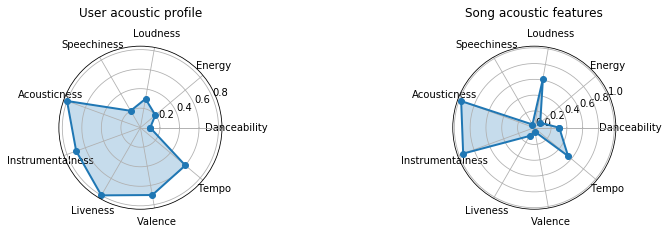

We recommend [Storms In Africa] by [Enya] to you:


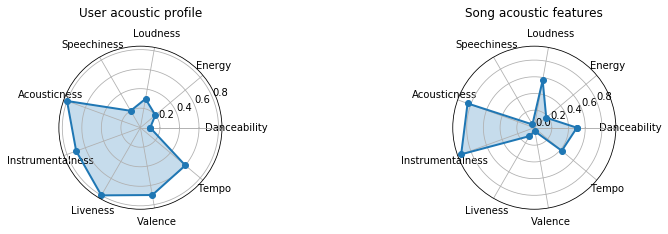

We recommend [Double Pump] by [Girl Talk] to you:


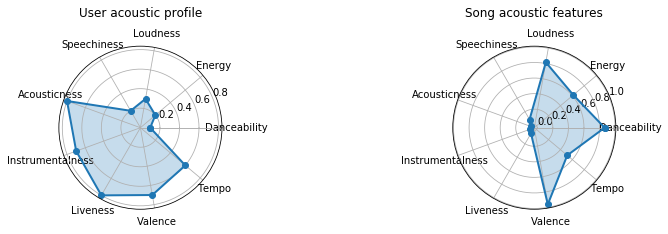

We recommend [The English Way] by [Fightstar] to you:


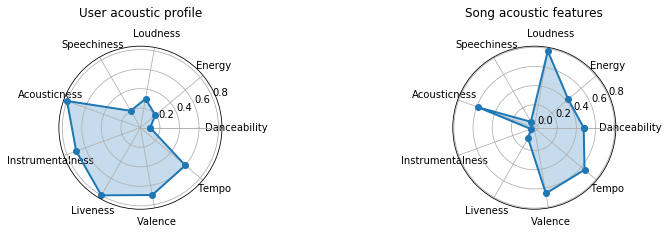

We recommend [Exile] by [Enya] to you:


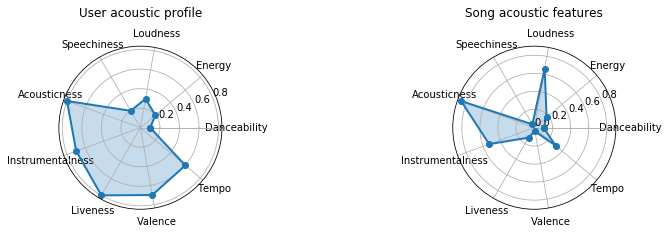

We recommend [I Want Tomorrow] by [Enya] to you:


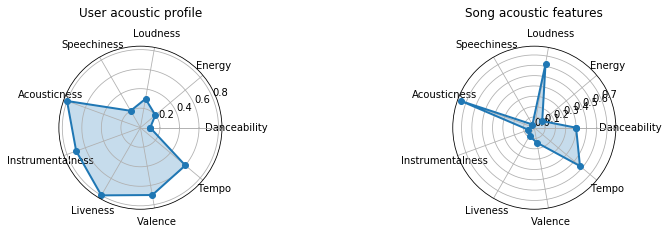

In [ ]:
start_recommender_system_UI()

### Import

In [1]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from adjustText import adjust_text
from collections import defaultdict
%matplotlib inline

import cornac
from cornac.models import Recommender
from sklearn.neighbors import NearestNeighbors

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


ModuleNotFoundError: ignored

### Load Data and Model

In [ ]:
# data
TRAIN_DATA_PATH = "Data/triplets_train_sample.csv"
SONG_DATA_PATH = "Data/songs.csv"
TRACK_GENRE_PATH = "Data/track_genre.txt"
SPOTIFY_PATH = "Data/spotify.csv"

# pre-trained weights
MODEL_PATH = "Models/finalized_wmf_model.pkl"
USER_IDX2ID_FILEPATH = "Models/user_idx2id_wmf.csv"
ITEM_IDX2ID_FILEPATH = "Models/item_idx2id_wmf.csv"

# acoustics features
ACOUSTIC_FEATURES = ["spotify_danceability", "spotify_energy", "spotify_loudness", "spotify_speechiness", 
                      "spotify_acousticness", "spotify_instrumentalness", "spotify_liveness", 
                      "spotify_valence", "spotify_tempo"]
ACOUSTIC_DISPLAY_COLS = ["Danceability", "Energy", "Loudness", "Speechiness", "Acousticness", "Instrumentalness",
                          "Liveness", "Valence", "Tempo"]

In [ ]:
# load model
model = Recommender.load(MODEL_PATH)

# load user mapping
user_idx2id_df = pd.read_csv(USER_IDX2ID_FILEPATH)
user_idx2id_df.columns = ["user_id"]
user_idx2id = user_idx2id_df["user_id"].values.tolist()

# load song mapping
item_idx2id_df = pd.read_csv(ITEM_IDX2ID_FILEPATH)
item_idx2id_df.columns = ['item_id']
item_idx2id = item_idx2id_df["item_id"].values.tolist()

# load triplets and song metadata
triplets_train = pd.read_csv(TRAIN_DATA_PATH, sep=",")
song_df = pd.read_csv(SONG_DATA_PATH, usecols=['song_id','track_id','title','artist_name','artist_id'])
track_genre_df = pd.read_csv(TRACK_GENRE_PATH, sep='\t', names=['track_id', 'genre'])
spotify_df = pd.read_csv(SPOTIFY_PATH)

metadata_df = pd.merge(song_df,track_genre_df,on='track_id',how='left').set_index("song_id")
metadata_df = metadata_df.rename(columns={"title": "TITLE", "artist_name": "ARTIST", "genre": "GENRE"})
metadata_df = metadata_df.replace(np.nan, 'Unknown', regex=True)

triplets_song_df = pd.merge(triplets_train,song_df,on='song_id',how='left')
meta_triplets_df = pd.merge(triplets_song_df,track_genre_df,on='track_id',how='left').set_index("song_id")
meta_triplets_df = meta_triplets_df.rename(
    columns={"title": "TITLE", "artist_name": "ARTIST", "genre": "GENRE", "play_count": "PLAY_COUNT"})
meta_triplets_df = meta_triplets_df.replace(np.nan, 'Unknown', regex=True)

# acoustic features for each artist
artist_acoustic_df = pd.merge(song_df, spotify_df, on="song_id") \
                        .groupby(['artist_id'])[spotify_df.columns[1:]] \
                        .mean().reset_index()

# acoustic preference for each user
# use top 20 songs for each user to derive preference
user_acoustic_df = triplets_song_df.sort_values('play_count',ascending = False) \
                                    .groupby('user_id') \
                                    .head(20) \
                                    .merge(spotify_df, on='song_id') \
                                    .groupby(['user_id'])[spotify_df.columns[1:]] \
                                    .mean().reset_index()

### Recommender System Functions

In [ ]:
def check_valid_user(user_input):
    try:
        int(user_input)
    except ValueError:
        return False
    else:
        UIDX = int(user_input)
        if UIDX >= len(user_idx2id):
            return False
        
        user_df = meta_triplets_df[meta_triplets_df['user_id'] == user_idx2id[UIDX]]
        if len(user_df) == 0:
            return False
        else:
            return True

In [ ]:
def display_profile(UIDX, h_box_artists, TOPK_SONG=10, TOPK_ARTIST=5, TOPK_GENRE=5):
    print('\n')
    print(">>>>>>>>>>>>>>>>>>>>>>> YOUR STATISTICS AT A GLANCE <<<<<<<<<<<<<<<<<<<<<<")
    print('\n')
    print(">>>>>> TOP", TOPK_SONG, "SONGS PLAYED OF ALL TIME <<<<<<")
    print('\n')
    user_df = meta_triplets_df[meta_triplets_df['user_id'] == user_idx2id[UIDX]]
    top_songs_df = user_df.sort_values('PLAY_COUNT', ascending=False)[:TOPK_SONG][['PLAY_COUNT','TITLE', 'ARTIST', 'GENRE']]
    print(top_songs_df.to_string(index=False))
    print('\n')
    
    top_artists = user_df.groupby("ARTIST").size().nlargest(TOPK_ARTIST).index.tolist()
    print('\n')
    print(">>>>>> TOP", TOPK_ARTIST, "ARTISTS PLAYED OF ALL TIME <<<<<<")
    print(', '.join(top_artists))
    if UIDX == 0:
        display.display(h_box_artists)
    print('\n')
    
    top_genres = user_df.groupby("GENRE").size().nlargest(TOPK_GENRE).index.tolist()
    print('\n')
    print(">>>>>> TOP", TOPK_GENRE, "GENRES PLAYED OF ALL TIME <<<<<<")
    print(', '.join(top_genres))
    print('\n')

In [ ]:
# generate acoustic profile for an existing user
def generate_acoustic_profile(UIDX):
    max_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].max(axis=0)
    min_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].min(axis=0)
    normalized_user_acoustics_df = (user_acoustic_df.loc[UIDX, ACOUSTIC_FEATURES] - min_df)/(max_df-min_df)
    stats = normalized_user_acoustics_df.values
    
    # draw radar chart
    angles=np.linspace(0, 2*np.pi, len(ACOUSTIC_DISPLAY_COLS), endpoint=False)
    # close the plot
    stats=np.concatenate((stats,[stats[0]]))
    angles=np.concatenate((angles,[angles[0]]))

    fig=plt.figure()
    ax = fig.add_subplot(111, polar=True)
    ax.plot(angles, stats, 'o-', linewidth=2)
    ax.fill(angles, stats, alpha=0.25)
    ax.set_thetagrids(angles * 180/np.pi, ACOUSTIC_DISPLAY_COLS)
    ax.set_title("Your acoustic profile\n")
    ax.grid(True)
    plt.show()

In [ ]:
# display acoustic profile from an user acoustic preference
def display_acoustic_profile(acoustic_pref):    
    # draw radar chart
    angles=np.linspace(0, 2*np.pi, len(ACOUSTIC_DISPLAY_COLS), endpoint=False)
    # close the plot
    stats=np.concatenate((acoustic_pref,[acoustic_pref[0]]))
    angles=np.concatenate((angles,[angles[0]]))

    fig=plt.figure()
    ax = fig.add_subplot(111, polar=True)
    ax.plot(angles, stats, 'o-', linewidth=2)
    ax.fill(angles, stats, alpha=0.25)
    ax.set_thetagrids(angles * 180/np.pi, ACOUSTIC_DISPLAY_COLS)
    ax.set_title("Your acoustic profile\n")
    ax.grid(True)
    plt.show()

In [ ]:
# explain reccomendations using radar map (acoustic features)
def explain_acoustic(UIDX, recs):
    for rec_idx in recs:
        rec_id = item_idx2id[rec_idx]
        
        max_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].max(axis=0)
        min_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].min(axis=0)
        normalized_user_acoustics_df = (user_acoustic_df.loc[UIDX, ACOUSTIC_FEATURES] - min_df)/(max_df-min_df)
        stats = normalized_user_acoustics_df.values

        max_song_df = spotify_df.loc[:, ACOUSTIC_FEATURES].max(axis=0)
        min_song_df = spotify_df.loc[:, ACOUSTIC_FEATURES].min(axis=0)
        normalized_song_acoustics_df = (spotify_df[spotify_df["song_id"] == rec_id][ACOUSTIC_FEATURES] \
                                        - min_song_df)/(max_song_df-min_song_df)
        
        if normalized_song_acoustics_df.empty:
            continue # skip to next song if the acoustic information not available
        song_stats = normalized_song_acoustics_df.values.tolist()[0]
        
        print("We recommend [" + metadata_df.loc[rec_id].TITLE + "] by [" + \
               metadata_df.loc[rec_id].ARTIST + "] to you:")
        
        # draw radar chart
        angles=np.linspace(0, 2*np.pi, len(ACOUSTIC_DISPLAY_COLS), endpoint=False)
        # close the plot
        song_stats=np.concatenate((song_stats,[song_stats[0]]))
        user_stats=np.concatenate((stats,[stats[0]]))
        angles=np.concatenate((angles,[angles[0]]))

        fig=plt.figure(figsize=(10,3))
        ax1 = fig.add_subplot(131, polar=True)
        ax1.plot(angles, user_stats, 'o-', linewidth=2)
        ax1.fill(angles, user_stats, alpha=0.25)
        ax1.set_thetagrids(angles * 180/np.pi, ACOUSTIC_DISPLAY_COLS)
        ax1.set_title("User acoustic profile\n")
        ax1.grid(True)

        ax2 = fig.add_subplot(133, polar=True)
        ax2.plot(angles, song_stats, 'o-', linewidth=2)
        ax2.fill(angles, song_stats, alpha=0.25)
        ax2.set_thetagrids(angles * 180/np.pi, ACOUSTIC_DISPLAY_COLS)
        ax2.set_title("Song acoustic features\n")
        ax2.grid(True)

        plt.subplots_adjust(hspace = 6)
        plt.show() 

In [ ]:
# recommend using WMF model
def recommend(model, UIDX, TOPK=10):
    recommendations, scores = model.rank(UIDX)
    print('\n')
    print(">>>>>>>>>>>>>>>>>>>>>>> SONGS YOU MIGHT LIKE <<<<<<<<<<<<<<<<<<<<<<")
    print('\n')
    display_df = metadata_df.loc[[item_idx2id[i] for i in recommendations[:TOPK]]][['TITLE', 'ARTIST', 'GENRE']]
    print(display_df.to_string(index=False))
    return recommendations[:TOPK]

In [ ]:
# explain the recommendations made by WMF model
def explain_rec(wmf, UIDX, recs, TOPK=3, detailed=True):
    explainations = ''
    for rec_idx in recs:
        rec_id = item_idx2id[rec_idx]

        U, V, lbd = wmf.U, wmf.V, wmf.lambda_v
        pi = wmf.train_set.matrix[UIDX].A.ravel()
        ci = (pi > 0) * (wmf.a - wmf.b) + wmf.b

        Wu = np.linalg.inv(V.T.dot(np.diag(ci)).dot(V) + lbd * np.eye(wmf.k))
        sim = V[rec_idx].dot(Wu).dot(V.T)
        contribution = sim * ci * pi

        top_contributors = defaultdict(list)
        for idx in np.argsort(contribution)[-TOPK:][::-1]:
            if idx != rec_idx: # exclude the same song
                top_contributors["TITLE"].append(metadata_df.loc[[(item_idx2id[idx])]]["TITLE"].values[0])
                top_contributors["ARTIST"].append(metadata_df.loc[[(item_idx2id[idx])]]["ARTIST"].values[0])
                top_contributors["GENRE"].append(metadata_df.loc[[(item_idx2id[idx])]]["GENRE"].values[0])
                top_contributors["Similarity"].append(sim[idx])
                top_contributors["Confidence"].append(ci[idx])
                top_contributors["Adoption"].append(pi[idx])
                top_contributors["Contribution"].append(contribution[idx])
        
        explain_body = '\n'
        if detailed:
            display_df = pd.DataFrame.from_dict(top_contributors)[["TITLE", "ARTIST", "GENRE"]]
            explain_body = explain_body + "We recommend [" + metadata_df.loc[rec_id].TITLE + "] by [" + \
              metadata_df.loc[rec_id].ARTIST + "] to you because you also listened to:\n" + \
            display_df.to_string(index=False, header=False)
        else:
            contributor_str = ','.join(top_contributors["TITLE"])
            explain_body = explain_body + "We recommend [" + metadata_df.loc[rec_id].TITLE + "] by ["+ \
              metadata_df.loc[rec_id].ARTIST + "] to you because you also listened to:" + contributor_str
        explainations = explainations + explain_body + '\n'
    return explainations

In [ ]:
# recommend songs that user have not listened to before
# based on WMF
def explore(model, UIDX, genre, TOPK=10, exclude_familiar_artists=False, TOP_N_ARTIST=10):
    recommendations, scores = model.rank(UIDX)
    user_history_df = meta_triplets_df[meta_triplets_df['user_id'] == user_idx2id[UIDX]]
    history_songs = user_history_df.index.to_list()
    # top N artists are familiar artists
    familiar_artists = user_history_df.groupby("ARTIST").size().nlargest(TOP_N_ARTIST).index.tolist()
    novel_recs = []
    for rec_idx in recommendations:
        song_id = item_idx2id[rec_idx]
        song_artist = metadata_df.loc[song_id]["ARTIST"]
        song_genre = metadata_df.loc[song_id]["GENRE"]
        if len(novel_recs) >= TOPK:
            break        
        if song_id not in history_songs: # novel songs
            # exclude familar artists
            if (exclude_familiar_artists and song_artist not in familiar_artists) or not exclude_familiar_artists:
                # select genre
                if genre == "ALL" or song_genre == genre:
                    novel_recs.append(rec_idx)
    
    text_body ='\n>>>>>>>>>>>>>>>>>>>>>>> EXPLORE NEW SONGS <<<<<<<<<<<<<<<<<<<<<<\n\n'
    display_df = metadata_df.loc[[item_idx2id[i] for i in novel_recs]][['TITLE', 'ARTIST', 'GENRE']]
    text_body = text_body + display_df.to_string(index=False)
    return novel_recs, text_body

In [ ]:
# get top songs of an artist
def recommend_artist_top_songs(selected_artists_names, TOPK=5):    
    for artist_name in selected_artists_names:
        artist_df = metadata_df[metadata_df['ARTIST'] == artist_name]
        if not artist_df.empty:
            artist_id = artist_df['artist_id'].drop_duplicates().values[0]
            artist_history_df = meta_triplets_df[meta_triplets_df['artist_id'] == artist_id]
            artist_songs_df = artist_history_df.groupby("song_id")['PLAY_COUNT'].apply(lambda x:x.sum()) \
                                               .sort_values(ascending=False)
            top_k_songs_df = artist_songs_df[:TOPK]
            top_k_songs_list = top_k_songs_df.index.tolist()
            display_df = metadata_df.loc[top_k_songs_list][['TITLE', 'ARTIST', 'GENRE']]
            
            print("People who follow [", artist_name, "] are listening to...\n")
            print(display_df.to_string(index=False))
            print('\n') 

In [ ]:
# generate new user profile from his artist preference
def generate_new_user_profile(selected_artists_names):
    selected_artists = []
    for each in selected_artists_names:
        artist_df = metadata_df[metadata_df['ARTIST'] == each]
        if not artist_df.empty:
            selected_artists.append(artist_df['artist_id'].drop_duplicates().values[0])
    # print(selected_artists)   
    # based on selected artists, find the acoustive preference for the user
    new_user_vector = artist_acoustic_df.loc[artist_acoustic_df.artist_id.isin(selected_artists)].mean()

    max_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].max(axis=0)
    min_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].min(axis=0)
    normalized_user_acoustics_df = (new_user_vector[ACOUSTIC_FEATURES] - min_df)/(max_df-min_df)
    stats = normalized_user_acoustics_df.values
    
    # draw radar chart
    angles=np.linspace(0, 2*np.pi, len(ACOUSTIC_DISPLAY_COLS), endpoint=False)
    # close the plot
    stats=np.concatenate((stats,[stats[0]]))
    angles=np.concatenate((angles,[angles[0]]))

    fig=plt.figure()
    ax = fig.add_subplot(111, polar=True)
    ax.plot(angles, stats, 'o-', linewidth=2)
    ax.fill(angles, stats, alpha=0.25)
    ax.set_thetagrids(angles * 180/np.pi, ACOUSTIC_DISPLAY_COLS)
    ax.set_title("Your acoustic profile\n")
    ax.grid(True)
    plt.show()
    
    return new_user_vector, stats

In [ ]:
# denormalize an user acoustic preference input in order to find nearest neighbors
def denormalize_acoustic_pref(acoustic_pref):
    acoustic_pref_df = pd.DataFrame(columns=ACOUSTIC_FEATURES)
    acoustic_pref_df.loc[0] = acoustic_pref
    max_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].max(axis=0)
    min_df = user_acoustic_df.loc[:, ACOUSTIC_FEATURES].min(axis=0)
    denormalized_user_acoustics_df = (acoustic_pref_df.loc[0, ACOUSTIC_FEATURES])*(max_df-min_df) + min_df
    stats = acoustic_pref_df.loc[0].values

    return denormalized_user_acoustics_df, stats

In [ ]:
def explain_acoustic_new_user(user_acoustic_stats, recs, isAcoustic):
    for rec_idx in recs:
        rec_id = item_idx2id[rec_idx]
        
        max_song_df = spotify_df.loc[:, ACOUSTIC_FEATURES].max(axis=0)
        min_song_df = spotify_df.loc[:, ACOUSTIC_FEATURES].min(axis=0)
        normalized_song_acoustics_df = (spotify_df[spotify_df["song_id"] == rec_id][ACOUSTIC_FEATURES] \
                                        - min_song_df)/(max_song_df-min_song_df)
        
        if normalized_song_acoustics_df.empty:
            continue # skip to next song if the acoustic information not available
        song_stats = normalized_song_acoustics_df.values.tolist()[0]
        
        print("We recommend [" + metadata_df.loc[rec_id].TITLE + "] by [" + \
               metadata_df.loc[rec_id].ARTIST + "] to you:")
        
        # draw radar chart
        angles=np.linspace(0, 2*np.pi, len(ACOUSTIC_DISPLAY_COLS), endpoint=False)
        # close the plot
        song_stats=np.concatenate((song_stats,[song_stats[0]]))
        if isAcoustic:
            user_stats=np.concatenate((user_acoustic_stats,[user_acoustic_stats[0]]))
        else:
            user_stats=user_acoustic_stats
        angles=np.concatenate((angles,[angles[0]]))

        fig=plt.figure(figsize=(10,3))
        ax1 = fig.add_subplot(131, polar=True)
        ax1.plot(angles, user_stats, 'o-', linewidth=2)
        ax1.fill(angles, user_stats, alpha=0.25)
        ax1.set_thetagrids(angles * 180/np.pi, ACOUSTIC_DISPLAY_COLS)
        ax1.set_title("User acoustic profile\n")
        ax1.grid(True)

        ax2 = fig.add_subplot(133, polar=True)
        ax2.plot(angles, song_stats, 'o-', linewidth=2)
        ax2.fill(angles, song_stats, alpha=0.25)
        ax2.set_thetagrids(angles * 180/np.pi, ACOUSTIC_DISPLAY_COLS)
        ax2.set_title("Song acoustic features\n")
        ax2.grid(True)

        plt.subplots_adjust(hspace = 6)
        plt.show() 

In [ ]:
# find nearest nighbors based on artist preference
def find_nearest_neighbors(user_vector, num_neighbors=5):
    knn = NearestNeighbors(n_neighbors=num_neighbors)
    knn.fit(user_acoustic_df[ACOUSTIC_FEATURES])
    dist, indices = knn.kneighbors([user_vector[ACOUSTIC_FEATURES]])
    neighbor_indices = indices[0]
    perc_dist = dist[0]/dist[0].sum()
    distance_dict = {'user_id': user_acoustic_df.iloc[neighbor_indices].user_id.values, 
                     'dist': dist[0], 'perc_dist': perc_dist}
    distance_df = pd.DataFrame.from_dict(distance_dict)
    
    user_id2idx_df = user_idx2id_df.loc[user_idx2id_df.user_id.isin(user_acoustic_df.iloc[neighbor_indices].user_id)] \
                                   .reset_index()
    user_id2idx_df.columns = ['user_idx', 'user_id']
    distance_df = distance_df.merge(user_id2idx_df, on='user_id')
    return distance_df

In [ ]:
# recommend for new user based on nearest neighbours 
def recommend_new_user(model, distance_df, TOPK=10):
    adjusted_scores = np.sum([model.score(row.user_idx) * row.perc_dist for row in distance_df.itertuples()], axis=0)
    recommendations = np.argpartition(adjusted_scores, len(adjusted_scores) - TOPK)[-TOPK:]
    sorted_recommendations = recommendations[np.argsort(adjusted_scores[recommendations])]  
    
    print('\n')
    print(">>>>>>>>>>>>>>>>>>>>>>> PEOPLE WITH SIMILAR TASTE ARE LISTENING TO <<<<<<<<<<<<<<<<<<<<<<")
    print('\n')
    display_df = metadata_df.loc[[item_idx2id[i] for i in sorted_recommendations[:TOPK]]][['TITLE', 'ARTIST', 'GENRE']]
    print(display_df.to_string(index=False))
    return sorted_recommendations[:TOPK]



>>>>>>>>>>>>>>>>>>>>>>> PEOPLE WITH SIMILAR TASTE ARE LISTENING TO <<<<<<<<<<<<<<<<<<<<<<


               TITLE             ARTIST               GENRE
           Lazy Days               Enya   Rock_Contemporary
      On My Way Home               Enya  Folk_International
  March Of The Celts               Enya   Rock_Contemporary
 The First Of Autumn               Enya   Rock_Contemporary
      Flora's Secret               Enya   Rock_Contemporary
     I Want Tomorrow               Enya   Rock_Contemporary
      Gli Amici Miei  Roberto Vecchioni  Folk_International
       Tempus Vernum               Enya   Rock_Contemporary
           Watermark               Enya  Folk_International
    Storms In Africa               Enya  Folk_International
We recommend [Lazy Days] by [Enya] to you:


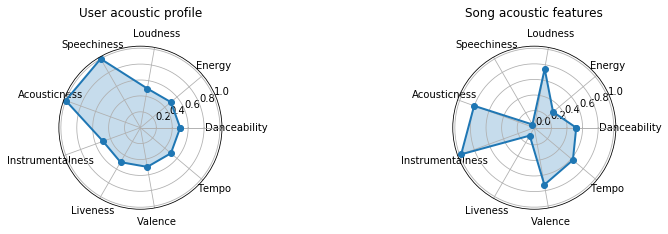

We recommend [On My Way Home] by [Enya] to you:


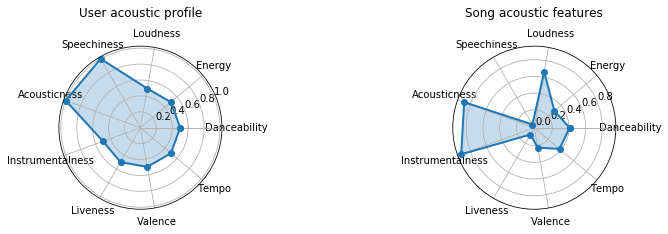

We recommend [March Of The Celts] by [Enya] to you:


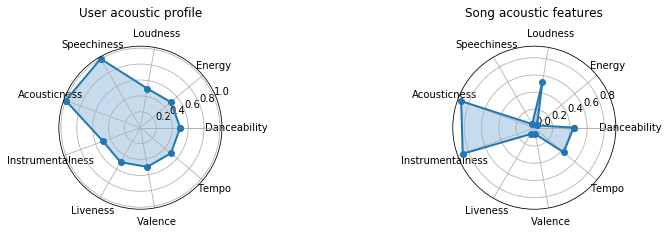

We recommend [The First Of Autumn] by [Enya] to you:


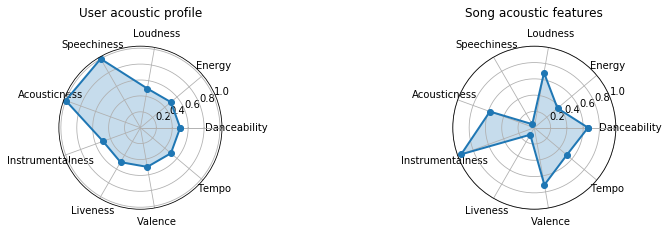

We recommend [Flora's Secret] by [Enya] to you:


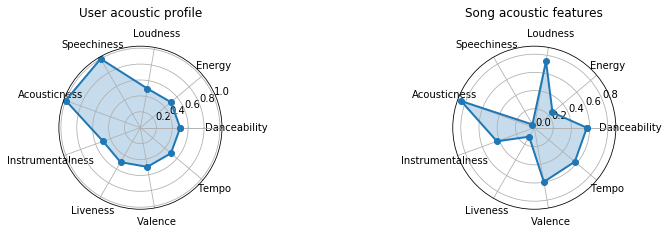

We recommend [I Want Tomorrow] by [Enya] to you:


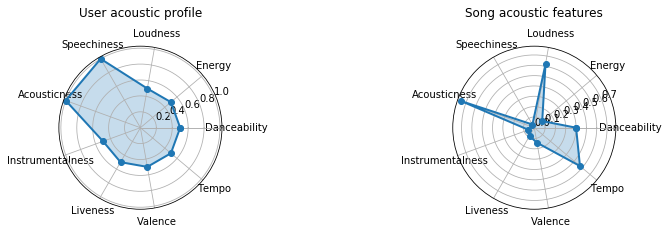

We recommend [Gli Amici Miei] by [Roberto Vecchioni] to you:


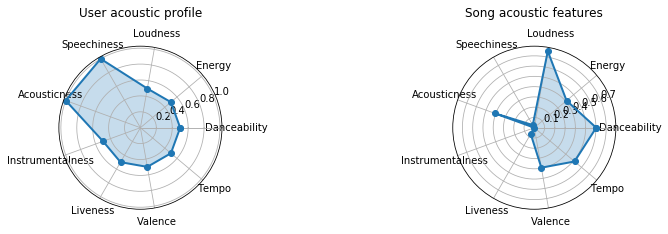

We recommend [Tempus Vernum] by [Enya] to you:


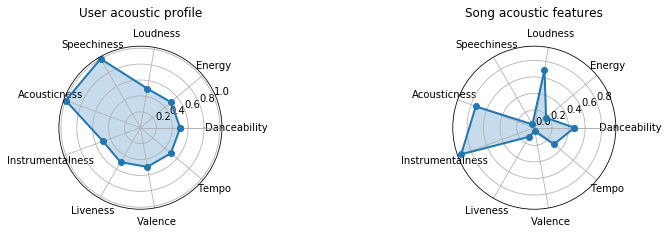

We recommend [Watermark] by [Enya] to you:


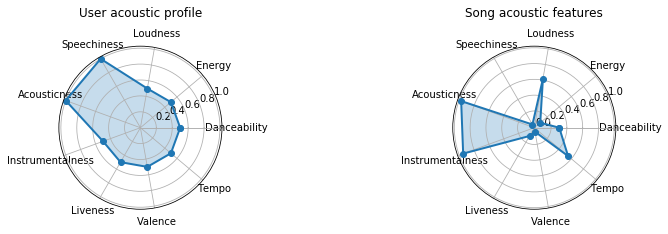

We recommend [Storms In Africa] by [Enya] to you:


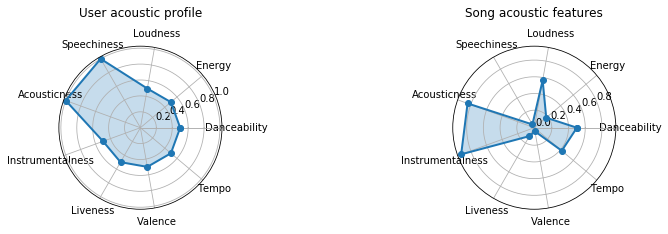

In [ ]:
# TEST
acoustic_pref = [0.5, 0.5, 0.5, 1.0, 1.0, 0.5, 0.5, 0.5, 0.5]
new_user_vector, user_acoustic_stats = denormalize_acoustic_pref(acoustic_pref)
distance_df = find_nearest_neighbors(new_user_vector)
new_user_rec = recommend_new_user(model, distance_df)
explain_acoustic_new_user(user_acoustic_stats, new_user_rec, True)

People who follow [ Dwight Yoakam ] are listening to...

          TITLE         ARTIST    GENRE
 You're The One  Dwight Yoakam  Unknown


People who follow [ Muse ] are listening to...

                      TITLE ARTIST         GENRE
                   Uprising   Muse       Unknown
                 Resistance   Muse  Experimental
                  Starlight   Muse       Unknown
   Map Of The Problematique   Muse  Experimental
 Butterflies and Hurricanes   Muse  Experimental




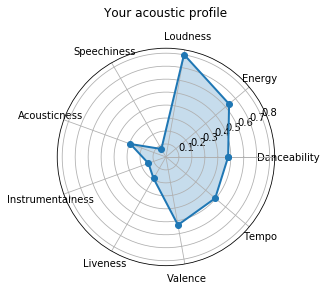



>>>>>>>>>>>>>>>>>>>>>>> PEOPLE WITH SIMILAR TASTE ARE LISTENING TO <<<<<<<<<<<<<<<<<<<<<<


                                           TITLE               ARTIST              GENRE
                                       Starlight                 Muse            Unknown
                                             #40   DAVE MATTHEWS BAND       Rock_College
                           Bitter Sweet Symphony            The Verve   Pop_Contemporary
                                         Secrets          OneRepublic  Rock_Contemporary
                                          Clocks             Coldplay       Rock_College
                             All The Right Moves          OneRepublic  Rock_Contemporary
                                   The Scientist             Coldplay   Pop_Contemporary
 I Will Follow You into the Dark (Album Version)  Death Cab for Cutie          Pop_Indie
                                        Dream On            Aerosmith          Rock_Hard
                

In [ ]:
# TEST
recommend_artist_top_songs(["Dwight Yoakam", "Muse"])
new_user_vector, stats = generate_new_user_profile(['The Black Keys', 'Coldplay', 'Vampire Weekend'])
distance_df = find_nearest_neighbors(new_user_vector)
new_user_rec = recommend_new_user(model, distance_df)

In [ ]:
# TEST
recommend(model, 0)
# explain_rec(model, recs, detailed=False)
explore(model, 0, "Reggae", TOPK=10, exclude_familiar_artists=True, TOP_N_ARTIST=10)



>>>>>>>>>>>>>>>>>>>>>>> SONGS YOU MIGHT LIKE <<<<<<<<<<<<<<<<<<<<<<


                            TITLE          ARTIST              GENRE
         Wordplay (Album Version)      Jason Mraz  Rock_Contemporary
             Somewhere In Between       Lifehouse  Metal_Alternative
      You And I Both (LP Version)      Jason Mraz  Rock_Contemporary
                         What If?        Godsmack  Metal_Alternative
 Geek In The Pink (Album Version)      Jason Mraz  Rock_Contemporary
       Sleep All Day (LP Version)      Jason Mraz  Rock_Contemporary
    Mr.Curiosity  (Album Version)      Jason Mraz  Rock_Contemporary
               Beautiful Disaster  Jon McLaughlin   Rock_Alternative
                            Blind       Lifehouse  Metal_Alternative
    I'll Do Anything (LP Version)      Jason Mraz  Rock_Contemporary


([4677, 17126, 11536, 11169, 5080, 3109, 18311, 7042, 2119, 4657],
 "\n>>>>>>>>>>>>>>>>>>>>>>> EXPLORE NEW SONGS <<<<<<<<<<<<<<<<<<<<<<\n\n                                    TITLE                 ARTIST   GENRE\n                  Stalker (Album Version)             Goldfinger  Reggae\n                                 Don't Go            Mad Caddies  Reggae\n                          Die Without You           Wayne Wonder  Reggae\n                                Moonlight             Rebelution  Reggae\n       Point/Counterpoint (Album Version)  Streetlight Manifesto  Reggae\n Somewhere In The Between (Album Version)  Streetlight Manifesto  Reggae\n                               Mr. Larkin            State Radio  Reggae\n                  Damaged (Album Version)             Goldfinger  Reggae\n             When The Night Feels My Song     Bedouin Soundclash  Reggae\n                          Girls Dem Sugar             Beenie Man  Reggae")

### Recommender System UI Components

In [ ]:
import ipywidgets as widgets
from IPython import display
from time import sleep

In [ ]:
LOGO_PATH = "logo.png"
BANNER_PATH = "main_banner.png"
LOADING_MSG = '<<ENTERING YOUR PERSONAL RADIO>>'
INTERPRETING_RECOMMENDATION_MSG = '<<INTERPRETING RECOMMENDATIONS>>'

# for demo
JASON_MRAZ_PATH = "demo_Jason_Mraz.jpg"
LIFEHOUSE_PATH = "demo_Lifehouse.jpg"
GREEN_DAY_PATH = 'demo_Green_Day.jpg'
IMMOLATION_PATH = "demo_Immolation.jpg"
JONAS_BROTHER_PATH = "demo_Jonas_Brother.jpg"
IMAGE_LIST = [JASON_MRAZ_PATH, LIFEHOUSE_PATH, GREEN_DAY_PATH, IMMOLATION_PATH, JONAS_BROTHER_PATH]
ENYA_PATH = "demo_Enya.jpg"
NIRVANA_PATH = "demo_Nirvana.jpg"
NEW_USER_IMAGE_LIST = [ENYA_PATH, NIRVANA_PATH]
CALIFORNIA_KING_BED_PATH = "demo_clip.mp3"

In [ ]:
# get top 50 most popular artists in the dataset
artist_count_df = meta_triplets_df.groupby("ARTIST").size().nlargest(100)
POPULAR_ARTISTS = artist_count_df.index.tolist()

# get list of all genres
genre_count_df = meta_triplets_df.groupby("GENRE").size()
GENRES = genre_count_df.index.tolist()
GENRES.append("ALL")

In [ ]:
### define widgets
# login page components
label = widgets.Label(value="Welcome to your personal radio station.")
file = open(LOGO_PATH, "rb")
image = file.read()
logo = widgets.Image(value=image, format='png', width=400, height=600)
btn_new = widgets.Button(description='New User')
btn_existing = widgets.Button(description='Existing User')

# login page container
login_box_layout = widgets.Layout(display='flex',flex_flow='column',align_items='center',width='100%')
login_box = widgets.HBox(children=[label, logo, btn_existing, btn_new],layout=login_box_layout)

# existing user signin
text_userID = widgets.Text(placeholder='Enter your userID', description='User ID',disabled=False)
file_banner = open(BANNER_PATH, "rb")
image_banner = file_banner.read()
banner = widgets.Image(value=image_banner, format='png')

# new user: choose from popular artists
toggle_btns_artist_pref = [widgets.ToggleButton(description=artist, button_style='info') for artist in POPULAR_ARTISTS]
v_boxes = [widgets.VBox([toggle_btns_artist_pref[20*w+i] for i in range(20)]) for w in range(5)]
h_box = widgets.HBox(v_boxes)
btn_OK = widgets.Button(description='Confirm Artist Preference', layout = widgets.Layout(width='auto'))

# new user: sliders to specify acoustic preference
slider_list = []
for feature in ACOUSTIC_DISPLAY_COLS:
    slider_list.append(widgets.FloatSlider(
        value=0.5, min=0, max=1.0, step=0.1,
        description=feature,
        disabled=False,
        continuous_update=False,
        orientation='vertical',
        readout=True,
        readout_format='.1f',
        layout=widgets.Layout(width='100px')
    ))
h_box_slider = widgets.HBox(slider_list)
btn_OK_acoustic = widgets.Button(description='Confirm Acoustic Preference', 
                                 layout = widgets.Layout(width='auto'))
    
# explorations
toggle_btn_exclude_artist = widgets.ToggleButtons(options=['Include', 'Exclude'], button_style='info')
dropdown_genre = widgets.Dropdown(options=GENRES, value='ALL', description='Genre:')
explore_out = widgets.Output()

# explain recommendations
SHOW_EXPLAINATION = 'Show Explaination'
HIDE_EXPLAINATION = 'Hide Explaination'
explain_out = widgets.Output()
explain_out.layout = widgets.Layout(visibility = 'hidden', height='0')
btn_explain_show = widgets.Button(description=SHOW_EXPLAINATION)
btn_explore = widgets.Button(description='Explore')

# for demo
image_widgets = []
for each in IMAGE_LIST:
    file = open(each, "rb")
    image = file.read()
    image_widgets.append(widgets.Image(value=image, format='jpg', width=180, height=200))
h_box_artists = widgets.HBox(image_widgets)

image_new_user = []
for each in NEW_USER_IMAGE_LIST:
    file = open(each, "rb")
    image = file.read()
    image_new_user.append(widgets.Image(value=image, format='jpg', width=180, height=200))
h_box_new_user = widgets.HBox(image_new_user)

# slider = widgets.IntSlider()
# DISPLAY_FIELDS = ['title', 'artist_name', 'genre']

### event handlers
def btn_new_event_handler(obj):
    display.clear_output(wait=True)
    print("You have signed in as a New User\n")
    print(">>>>>>>>>>>>>>>>>>>>>>>>> HELP US UNDERSTAND YOUR ARTIST PREFERENCE <<<<<<<<<<<<<<<<<<<<<<")
    display.display(h_box) 
    display.display(btn_OK)
    
    # or
    print(">>>>>>>>>>>>>>>>>>>>>>>>> HELP US UNDERSTAND YOUR ACOUSTIC PREFERENCE <<<<<<<<<<<<<<<<<<<<<<")
    display.display(h_box_slider)
    display.display(btn_OK_acoustic)

# confirm new user artists preference and recommend songs
def btn_OK_event_handler(obj):
    if obj.description == 'Confirm Artist Preference':
        artist_pref = []
        for each in toggle_btns_artist_pref:
            if each.value:
                artist_pref.append(each.description)
    else:
        acoustic_pref = []
        for each in slider_list:
            acoustic_pref.append(each.value)
            
    display.clear_output(wait=True)
    print_loading_msg(LOADING_MSG, 0.02)
    
    # display banner
    display.display(banner)
    print("Good evening, Aria! It's 21:00 PM.")
    print("Song for the evening mood: [Rihanna - California King Bed]")
    display.display(display.Audio(CALIFORNIA_KING_BED_PATH, autoplay=True))
    print_waves()
    
    ### display user's basic information
    print('\n')
    print("Name: Aria Stark")
    print("Account: Basic")
    if obj.description == 'Confirm Artist Preference':
        print("Your artist preferences:", artist_pref, "\n")
        
        # generate new user acoustic radar map
        new_user_vector, user_acoustic_stats = generate_new_user_profile(artist_pref)

        ### Recommendation based on aritst preference
        print("\n>>>>>>>>>>>>>>>>>>>>>>> SONGS YOU MIGHT LIKE BASED ON YOUR ARTISTS PEFERENCE <<<<<<<<<<<<<<<<<<<<<<\n\n")

        # for demo
        if "Enya" in artist_pref and "Nirvana" in artist_pref:
            display.display(h_box_new_user)

        print('\n')
        recommend_artist_top_songs(artist_pref)
        
        print_waves()
    
        # generate user profile
        distance_df = find_nearest_neighbors(new_user_vector)
        new_user_rec = recommend_new_user(model, distance_df)

        print_waves()

        ## explaination using acoustic radar map
        explain_acoustic_new_user(user_acoustic_stats, new_user_rec, False)
    
    else:
        # print("Your acoustic preferences:", acoustic_pref, "\n")
        display_acoustic_profile(acoustic_pref)
        
        print_waves()
        
        # denormalize user acoustic vector
        new_user_vector, user_acoustic_stats = denormalize_acoustic_pref(acoustic_pref)
        
        ### Recommendation based on acoustic preference
        # find nearest neighbor based on acoustic preference
        distance_df = find_nearest_neighbors(new_user_vector)
        new_user_rec = recommend_new_user(model, distance_df)
        
        print_waves()
        
        ## explaination using acoustic radar map
        explain_acoustic_new_user(user_acoustic_stats, new_user_rec, True)
    
def btn_existing_event_handler(obj):
    display.clear_output(wait=True)
    print("Enter your User ID")
    display.display(text_userID)

def btn_explain_show_event_handler(obj):
    if obj.description == SHOW_EXPLAINATION:
        explain_out.layout = widgets.Layout(visibility = 'visible')
        obj.description = HIDE_EXPLAINATION
    else:
        explain_out.layout = widgets.Layout(visibility = 'hidden', height='0')
        obj.description = SHOW_EXPLAINATION

        
def btn_explore_event_handler(obj):
    UIDX = int(text_userID.value)
    
    exclude_artist = (toggle_btn_exclude_artist.value == "Exclude")
    genre = dropdown_genre.value
    
    novel_recs, text = explore(model, UIDX, genre, TOPK=10, exclude_familiar_artists=exclude_artist, TOP_N_ARTIST=10)
    explore_out.append_stdout(text)
    display.display(explore_out)
    
    print_waves()
    
    ### explain using acoustic radar maps
    explain_acoustic(UIDX, novel_recs)
    
    ### explaination
    print("Generating explainations for recommendations......")
    explain_body = explain_rec(model, UIDX, novel_recs, detailed=False)
    explain_out.append_stdout(explain_body)
    print("Explainations are ready!")
     
    display.display(btn_explain_show)
    display.display(explain_out)
    
    
# entering user page for exisitng user
def text_callback(obj):
    if not check_valid_user(obj.value):
        print("Invalid User ID!")
        return
    
    display.clear_output(wait=True)    
    print_loading_msg(LOADING_MSG, 0.02)
    
    # display banner
    display.display(banner)
    print("Good evening, John! It's 21:00 PM.")
    print("Song for the evening mood: [Rihanna - California King Bed]")
    display.display(display.Audio(CALIFORNIA_KING_BED_PATH, autoplay=True))
    print_waves()
    
    UIDX = int(obj.value)
    
    ### display user's basic information
    print('\n')
    print("Name: John Snow")
    print("Account: Premium")
    print("Your unique ID:", user_idx2id[UIDX], '\n')
    
    # generate acoustic radar map
    generate_acoustic_profile(UIDX)
    
    print_waves()
    
    ### display user's top songs, artists, and genres
    display_profile(UIDX, h_box_artists)
    
    print_waves()
    
    ### make recommendation
    recs = recommend(model, UIDX)
    
    print_waves()
    
    ### explain using acoustic radar maps
    explain_acoustic(UIDX, recs)
    
    print_waves()
        
    ### explore (novel recommendations)
    # UI for explore settings  
    print("Choose whether to exclude your familiar artists:")
    display.display(toggle_btn_exclude_artist)
    print("Choose to explore a specific genre:")
    display.display(dropdown_genre)
    print("Explore novel songs that you haven't listened to before:")
    display.display(btn_explore)
    
    print_waves()

        
btn_new.on_click(btn_new_event_handler)
btn_existing.on_click(btn_existing_event_handler)
btn_explain_show.on_click(btn_explain_show_event_handler)
# toggle_btn_artist.observe(toggle_btn_artist_event_handler, 'value')
btn_explore.on_click(btn_explore_event_handler)
btn_OK.on_click(btn_OK_event_handler)
btn_OK_acoustic.on_click(btn_OK_event_handler)
text_userID.on_submit(text_callback)

In [ ]:
# UI functions
def print_loading_msg(msg, delay): 
    for i in range(len(msg)):
        print(msg[i], sep=' ', end=' ', flush=True); 
        sleep(delay)
    print('\n')

def print_waves():
    WAVES_MSG = '~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'
    print('\n')
    for i in range(len(WAVES_MSG)):
        print(WAVES_MSG[i], sep=' ', end=' ', flush=True); 
        sleep(0.02)
    print('\n')

In [ ]:
# start UI
def start_recommender_system_UI():
    display.display(login_box)